In [1]:
import numpy as np
import pandas as pd

In [5]:
data=pd.read_csv('1_TrainingSet_3Class.csv')
data.head()

,2,s801810168862408705,UPDATE: Rt. in York County has reopened near Commerce Circle. Detour lifted.
0,0,s899723031702065152,#Fargo #ND #USA - Sr. Clinical Research Associ...
1,0,s840600120727130112,Just two of the biggest fans riding the ride i...
2,1,s900335719461400580,Wreck on Southbound just north of Atlanta High...
3,0,s657684246153314304,Justin bieber's new album is going to be amazi...
4,0,s872960543077928962,Next up is the Sr. Manager of Football Develop...


In [6]:
data.drop(data.columns[1], axis=1, inplace=True)
print(data)

       2  \
0      0   
1      0   
2      1   
3      0   
4      0   
...   ..   
40936  0   
40937  2   
40938  1   
40939  0   
40940  0   

      UPDATE: Rt. in York County has reopened near Commerce Circle. Detour lifted.  
0      #Fargo #ND #USA - Sr. Clinical Research Associ...                            
1      Just two of the biggest fans riding the ride i...                            
2      Wreck on Southbound just north of Atlanta High...                            
3      Justin bieber's new album is going to be amazi...                            
4      Next up is the Sr. Manager of Football Develop...                            
...                                                  ...                            
40936  Start beach-bonfire-BBQ season off right with ...                            
40937  Snow quickly covering roads in the southern co...                            
40938  Updated: Crash in Duval on highway east at Exi...                            
40939

In [7]:
data.columns = ['class', 'tweet']
data

,class,tweet
0,0,#Fargo #ND #USA - Sr. Clinical Research Associ...
1,0,Just two of the biggest fans riding the ride i...
2,1,Wreck on Southbound just north of Atlanta High...
3,0,Justin bieber's new album is going to be amazi...
4,0,Next up is the Sr. Manager of Football Develop...
...,...,...
40936,0,Start beach-bonfire-BBQ season off right with ...
40937,2,Snow quickly covering roads in the southern co...
40938,1,Updated: Crash in Duval on highway east at Exi...
40939,0,Join the Truth Team and help set the record st...


<Axes: xlabel='class', ylabel='count'>

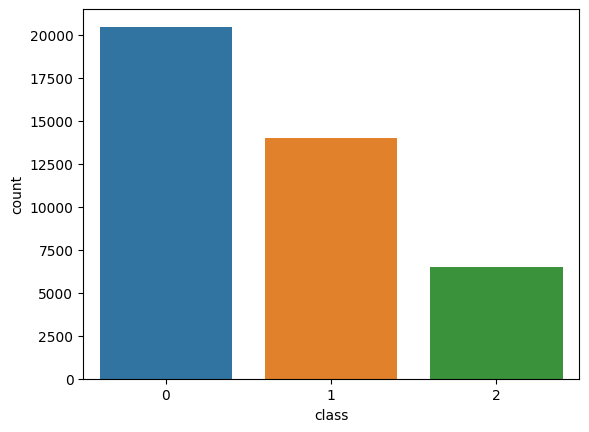

In [8]:
import seaborn as sns
sns.countplot(data=data,x='class')



In [5]:
import pandas as pd
import random


# Create empty dataframes for each class
class_0 = pd.DataFrame(columns=['class', 'tweet'])
class_1 = pd.DataFrame(columns=['class', 'tweet'])
class_2 = pd.DataFrame(columns=['class', 'tweet'])

# Split the dataset into separate dataframes based on class
for index, row in data.iterrows():
    tweet_class = row['class']
    tweet_text = row['tweet']
    if tweet_class == 0:
        class_0 = class_0.append({'class': tweet_class, 'tweet': tweet_text}, ignore_index=True)
    elif tweet_class == 1:
        class_1 = class_1.append({'class': tweet_class, 'tweet': tweet_text}, ignore_index=True)
    elif tweet_class == 2:
        class_2 = class_2.append({'class': tweet_class, 'tweet': tweet_text}, ignore_index=True)

# Randomly sample 1000 tweets from each class
sampled_class_0 = class_0.sample(n=1000, random_state=1)
sampled_class_1 = class_1.sample(n=1000, random_state=1)
sampled_class_2 = class_2.sample(n=1000, random_state=1)

# Concatenate the sampled dataframes to create the final balanced dataset
balanced_dataset = pd.concat([sampled_class_0, sampled_class_1, sampled_class_2])

# Shuffle the final dataset to mix the classes
balanced_dataset = balanced_dataset.sample(frac=1, random_state=1)

# Save the balanced dataset to a new CSV file
# Replace 'balanced_dataset.csv' with the desired filename for the balanced dataset
balanced_dataset.to_csv('balanced_dataset.csv', index=False)


C:\Users\shree\AppData\Local\Temp\ipykernel_20956\2816850987.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  class_0 = class_0.append({'class': tweet_class, 'tweet': tweet_text}, ignore_index=True)
C:\Users\shree\AppData\Local\Temp\ipykernel_20956\2816850987.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  class_0 = class_0.append({'class': tweet_class, 'tweet': tweet_text}, ignore_index=True)
C:\Users\shree\AppData\Local\Temp\ipykernel_20956\2816850987.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  class_1 = class_1.append({'class': tweet_class, 'tweet': tweet_text}, ignore_index=True)
C:\Users\shree\AppData\Local\Temp\ipykernel_20956\2816850987.py:15: FutureWarning: The frame.append method is deprecated and

In [6]:
df=pd.read_csv('balanced_dataset.csv')
df.head()

,class,tweet
0,1,"ORE99E, from Portland to Multnomah - Clackamas..."
1,2,CLEARED: IL Rte - Southbound at McGaw Rd the r...
2,1,highway MM . SB at Lebanon/ mile Left lanes sl...
3,1,Roadwork on highway westbound between Exit - P...
4,1,Rdwork on highway West btw Exit - CT (Danbury)...


<Axes: xlabel='class', ylabel='count'>

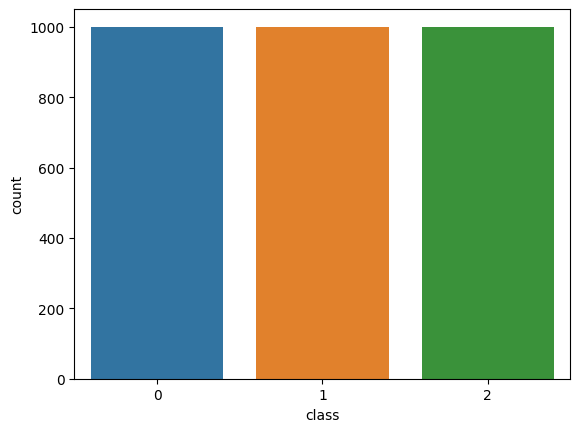

In [7]:
import seaborn as sns
sns.countplot(data=df,x='class')

In [10]:
import seaborn as sns
sns.countplot(data=df,x='class')

0       1
1       2
2       1
3       1
4       1
       ..
2995    2
2996    0
2997    1
2998    0
2999    1
Name: class, Length: 3000, dtype: int64


In [11]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import BertTokenizer, BertModel
import gensim
from gensim.models import Word2Vec
import nltk
import re  # Added for text cleaning
import torch


c:\Users\shree\anaconda3\envs\tensor\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [14]:
tfidf_vectorizer = TfidfVectorizer(max_features=1000)

# Clean the tweets by removing special characters
cleaned_tweets = [re.sub(r'[^\w\s]', '', tweet) for tweet in df['tweet']]

X_tfidf = tfidf_vectorizer.fit_transform(cleaned_tweets)  # Use cleaned tweets

# Save TF-IDF vectors to a CSV file
tfidf_df = pd.DataFrame(X_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_df['class'] = df['class']
tfidf_df.to_csv('tfidf_embeddings.csv', index=False)

# Step 3: Generate BERT Embeddings
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Tokenize and generate BERT embeddings for each tweet
bert_embeddings = []

for tweet in df['tweet']:
    tokens = tokenizer.encode(tweet, add_special_tokens=True, max_length=128, truncation=True)
    input_ids = torch.tensor(tokens).unsqueeze(0)  # assuming you have PyTorch imported
    outputs = model(input_ids)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().tolist()
    bert_embeddings.append(embeddings)

# Create a DataFrame with BERT embeddings
bert_df = pd.DataFrame(bert_embeddings)
bert_df['class'] = df['class']
bert_df.to_csv('bert_embeddings.csv', index=False)

# Step 4: Generate Word2Vec Embeddings
# Tokenize the tweets and train Word2Vec model
tokenized_tweets = [nltk.word_tokenize(tweet.lower()) for tweet in df['tweet']]
word2vec_model = Word2Vec(tokenized_tweets, vector_size=100, window=5, min_count=1, sg=0)

# Save Word2Vec embeddings to a CSV file
word2vec_df = pd.DataFrame([word2vec_model.wv[word] for tweet in tokenized_tweets for word in tweet])
word2vec_df['class'] = df['class']
word2vec_df.to_csv('word2vec_embeddings.csv', index=False)